In [1]:
from IPython.core.interactiveshell import InteractiveShell
from IPython.core.display import HTML, display
from IPython.display import IFrame
InteractiveShell.ast_node_interactivity = 'all'
display(HTML("<style>.container { width:100% !important; }</style>"))
%config InlineBackend.figure_format = 'retina'

In [2]:
import os
import pandas as pd

wd = '/Users/zxs/Downloads'
os.chdir(wd)

import zipfile

fn = 'dutch-energy.zip'
stage = '/Users/zxs/data/dutch_energy'

try:
    
    os.mkdir(stage)
    
except:
    
    print('Directory exists')
    
z = zipfile.ZipFile(fn, 'r')
z.extractall(stage)
z.close()

os.listdir(stage)

['Gas', 'Electricity']

In [6]:
d = {}

for folder in os.listdir(stage):

    os.chdir(stage + '/' + folder)
    
    dat = []
    
    for file in os.listdir():
        
        df = pd.read_csv(file)
        
        dat.append(df)
    
    d[folder] = dat
    
    os.chdir(stage)

In [16]:
gas = pd.DataFrame()

for row in d['Gas']:
    
    gas = gas.append(row, ignore_index = True)

/Users/zxs/miniconda3/lib/python3.7/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


In [17]:
gas

,annual_consume,annual_consume_lowtarif_perc,city,delivery_perc,net_manager,num_connections,perc_of_active_connections,purchase_area,smartmeter_perc,street,type_conn_perc,type_of_connection,zipcode_from,zipcode_to
0,2267.0,0.0,AMSTERDAM,100.0,8716892700004,30.0,100.00,Duivendrecht,14.81,Tom Schreursweg,93.0,G4,1067MC,1115AB
1,3225.0,0.0,AMSTERDAM,100.0,8716892720002,30.0,100.00,Halfweg,0.00,Tom Schreursweg,93.0,G4,1067MC,1115AB
2,3525.0,0.0,DUIVENDRECHT,100.0,8716892700004,22.0,86.36,Duivendrecht,4.55,Molenkade,68.0,G4,1115AC,1115AC
3,7709.0,0.0,DUIVENDRECHT,100.0,8716892700004,10.0,100.00,Duivendrecht,10.00,Industrieweg,40.0,G6,1115AD,1115AD
4,2002.0,0.0,DUIVENDRECHT,100.0,8716892700004,14.0,92.86,Duivendrecht,7.14,Industrieweg,86.0,G4,1115AE,1115AG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3085752,1881.0,0.0,GERKESKLOOSTER,100.0,8716892740000,18.0,100.00,NG Noord-Oost Friesland,11.11,De Gauw,100.0,G4,9873RM,9873RM
3085753,1891.0,0.0,GERKESKLOOSTER,100.0,8716892740000,20.0,100.00,NG Noord-Oost Friesland,10.00,De Gauw,95.0,G4,9873RP,9873RS
3085754,1538.0,0.0,GERKESKLOOSTER,100.0,8716892740000,47.0,100.00,NG Noord-Oost Friesland,8.51,De Lauwers,100.0,G4,9873RV,9873RV
3085755,1628.0,0.0,GERKESKLOOSTER,100.0,8716892740000,10.0,100.00,NG Noord-Oost Friesland,0.00,De Lauwers,100.0,G4,9873RW,9873RW


In [20]:
import geopandas as gpd 

os.chdir('/Users/zxs/Downloads')
sh = gpd.read_file('Netherlands_shapefile/nl_1km.shp')
sh1 = gpd.read_file('Netherlands_shapefile/nl_10km.shp')
sh2 = gpd.read_file('Netherlands_shapefile/nl_100km.shp')

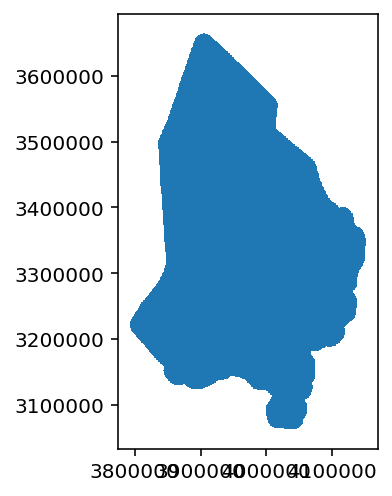

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

sh.plot()

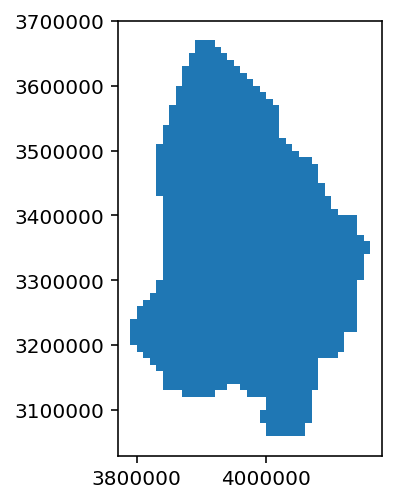

In [23]:
sh1.plot()

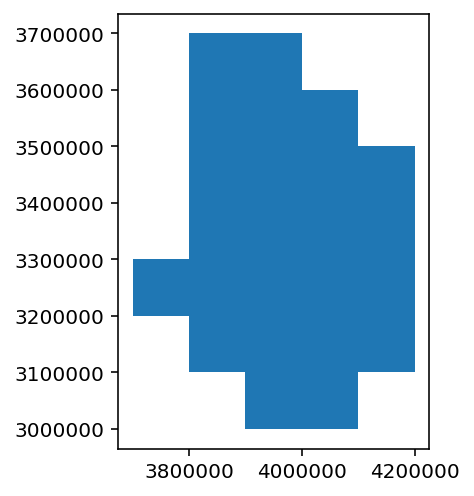

In [24]:
sh2.plot()

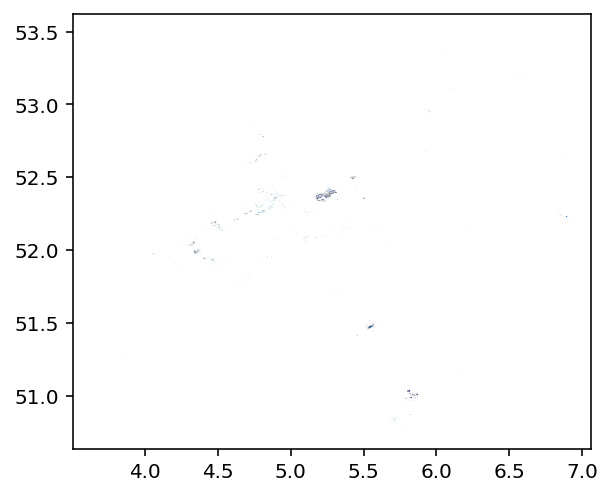

In [25]:
os.chdir('/Users/zxs/Downloads')
buildings = gpd.read_file('netherlands-building-shape/buildings.shp')
buildings.plot()

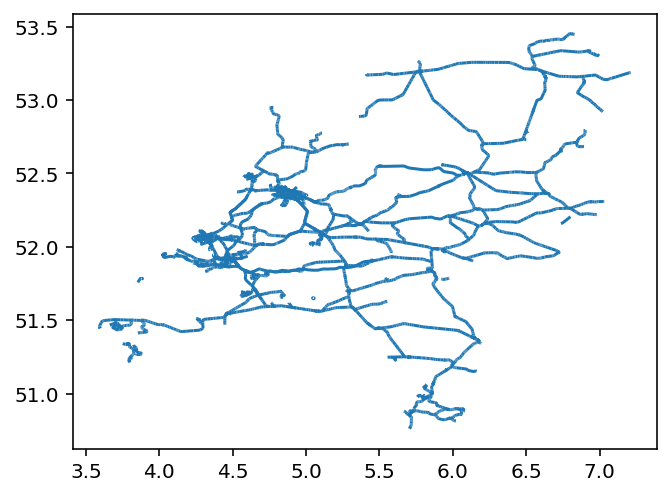

In [26]:
railways = gpd.read_file('netherlands-railways-shape/railways.shp')
railways.plot()

In [29]:
waterways = gpd.read_file('netherlands-waterways-shape/waterways.shp')
roads = gpd.read_file('netherlands-roads-shape/roads.shp')

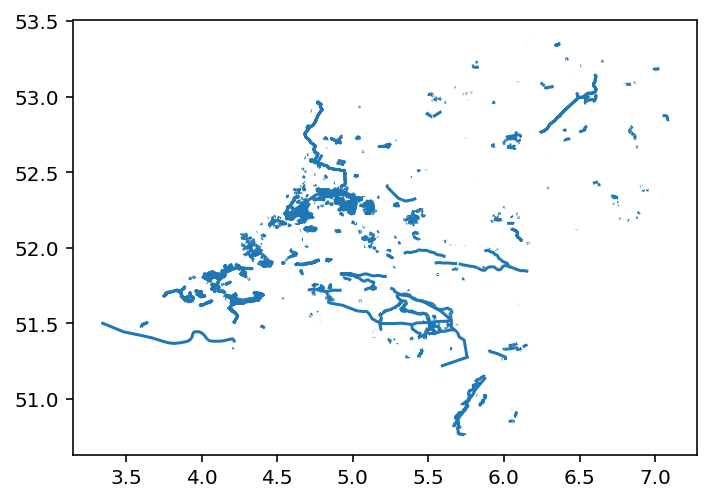

In [30]:
waterways.plot()

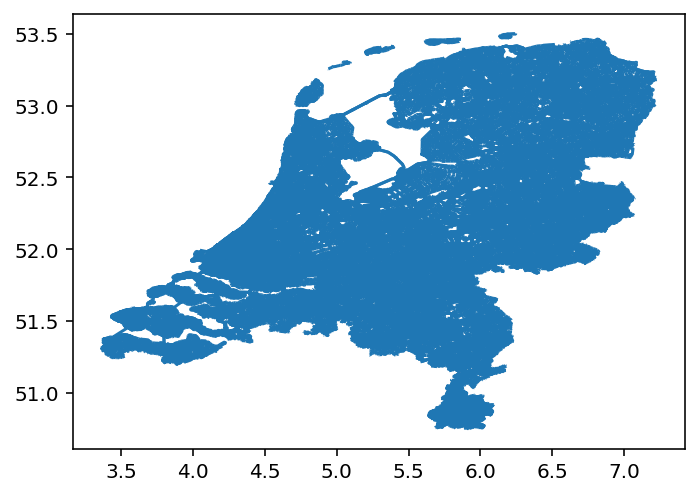

In [31]:
roads.plot()

/Users/zxs/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  """


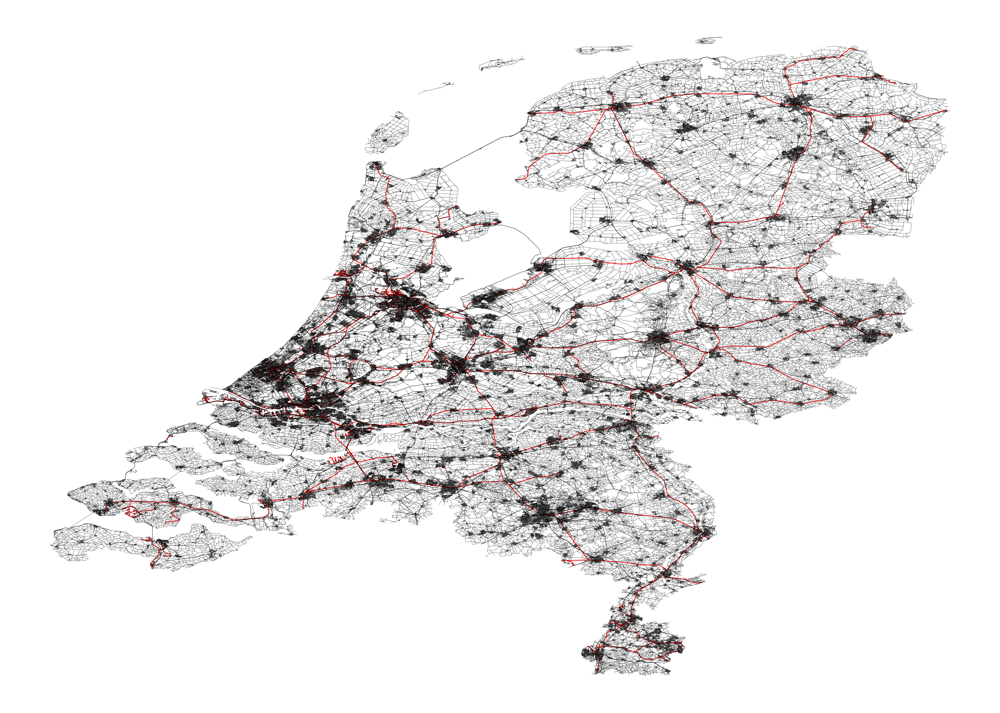

In [36]:
fig, ax = plt.subplots(figsize = [25, 25])
railways.plot(ax = ax, color = 'red', linewidth = 1)
roads.plot(ax = ax, color = 'black', alpha = .5, linewidth = .2)
ax.set_axis_off()
fig.show()

AttributeError: module 'matplotlib.pyplot' has no attribute 'set_title'

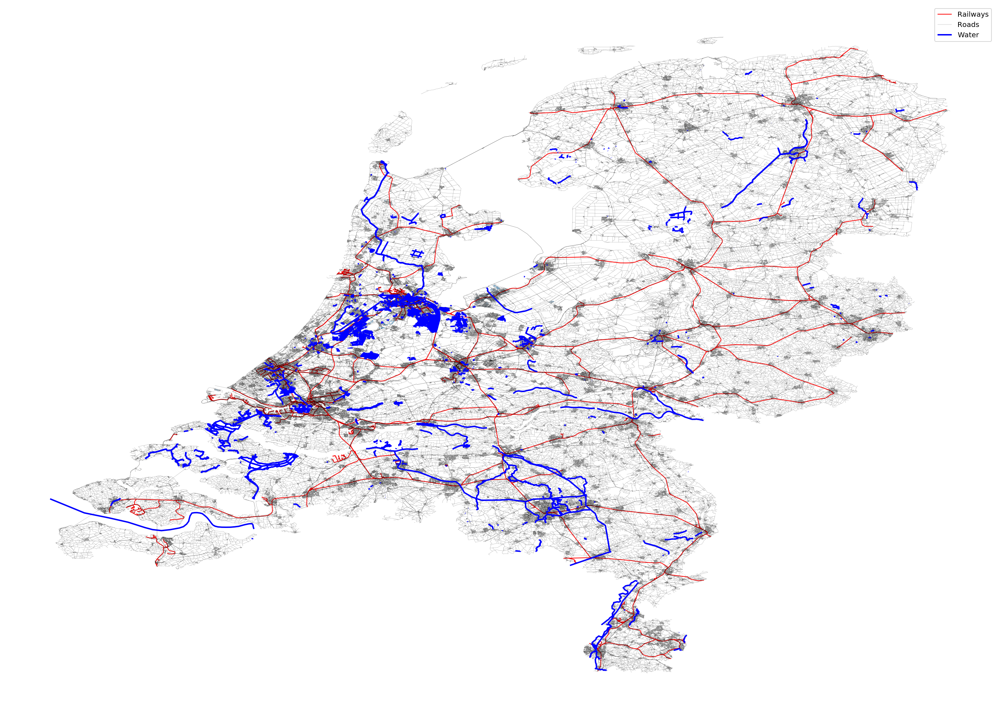

In [37]:
fig, ax = plt.subplots(figsize = [25, 25])
railways.plot(ax = ax, color = 'red', linewidth = 1, label = 'Railways')
roads.plot(ax = ax, color = 'black', alpha = .5, linewidth = .2, label = 'Roads')
buildings.plot(ax = ax)
waterways.plot(ax = ax, color = 'blue', linewidth = 2, label = 'Water')
ax.set_axis_off()
plt.legend()
plt.set_title('Comprehensive Map of the Netherlandas', fontsize = 32)
fig.show()

Text(0.5, 1, 'Comprehensive Map of the Netherlandas')

/Users/zxs/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if __name__ == '__main__':


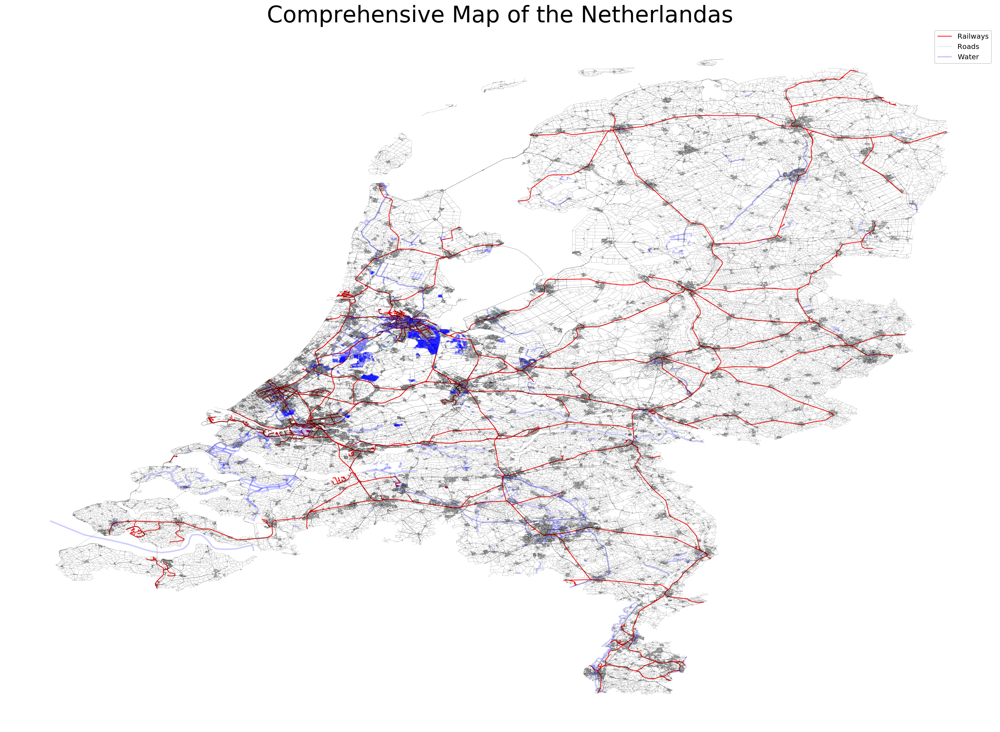

In [38]:
fig, ax = plt.subplots(figsize = [25, 25])
railways.plot(ax = ax, color = 'red', linewidth = 1, label = 'Railways')
roads.plot(ax = ax, color = 'black', alpha = .5, linewidth = .2, label = 'Roads')
buildings.plot(ax = ax, alpha = 1)
waterways.plot(ax = ax, color = 'blue', linewidth = 2, label = 'Water', alpha = .2)
ax.set_axis_off()
plt.legend()
ax.set_title('Comprehensive Map of the Netherlandas', fontsize = 32)
fig.show()

In [39]:
electricity = pd.DataFrame()

for row in d['Electricity']:
    
    electricity = electricity.append(row, ignore_index = True)

/Users/zxs/miniconda3/lib/python3.7/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


In [40]:
electricity.head()

,annual_consume,annual_consume_lowtarif_perc,city,delivery_perc,net_manager,num_connections,perc_of_active_connections,purchase_area,smartmeter_perc,street,type_conn_perc,type_of_connection,zipcode_from,zipcode_to
0,5909.0,90.00,HILVERSUM,90.00,8716874000009,30.0,100.0,Stedin Utrecht,53.33,Egelshoek,80.0,3x25,1213RC,1231AB
1,3062.0,94.12,LOOSDRECHT,100.00,8716874000009,17.0,100.0,Stedin Utrecht,76.47,Rembrandtlaan,41.0,1x25,1231AC,1231AC
2,3959.0,82.35,LOOSDRECHT,100.00,8716874000009,17.0,100.0,Stedin Utrecht,52.94,Rembrandtlaan,47.0,3x25,1231AD,1231AD
3,4230.0,90.00,LOOSDRECHT,100.00,8716874000009,20.0,100.0,Stedin Utrecht,45.00,Jan Steenlaan,45.0,3x25,1231AE,1231AE
4,3180.0,94.12,LOOSDRECHT,94.12,8716874000009,17.0,100.0,Stedin Utrecht,88.24,Pieter de Hooghlaan,71.0,1x25,1231AG,1231AG


In [42]:
buildings1 = buildings.loc[buildings['type'] != 'None']

In [ ]:
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon as PG
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize
import geopandas as gpd
import folium
from matplotlib.patches import Patch
from shapely.geometry import Point, Polygon
import shapely.speedups
shapely.speedups.enable()
from geopandas import GeoDataFrame